In [1]:
import fastai
from fastai.vision.all import *
from icevision.all import *
from icevision.models import *
from mmcv.runner import (
    load_checkpoint,
    save_checkpoint,
    _load_checkpoint,
    load_state_dict,
)

In [2]:
def model_from_checkpoint(
    filename: Union[Path, str],
    model_name=None,
    backbone_name=None,
    classes=None,
    is_coco=False,
    img_size=None,
    map_location=None,
    strict=False,
    revise_keys=[
        (r"^module\.", ""),
    ],
    eval_mode=True,
    logger=None,
):
    """load checkpoint through URL scheme path.
    Args:
        filename (str): checkpoint file name with given prefix
        map_location (str, optional): Same as :func:`torch.load`.
            Default: None
    Returns:
        dict or OrderedDict: The loaded checkpoint.
    """

    if isinstance(filename, Path):
        filename = str(filename)

    checkpoint = _load_checkpoint(
        filename=filename, map_location=map_location, logger=logger
    )

    if is_coco and classes:
        err_msg = "`is_coco` cannot be set to True if `classes` is passed and `not None`. `classes` has priority. `is_coco` will be ignored."
        if logger is not None:
            logger.warning(err_msg)
        else:
            print(err_msg)

    if classes is None:
        if is_coco:
            classes = CLASSES
        else:
            classes = checkpoint["meta"].get("classes", None)

    class_map = None
    if classes:
        class_map = ClassMap(classes)
        num_classes = len(class_map)

    if img_size is None:
        img_size = checkpoint["meta"].get("img_size", None)

    if model_name is None:
        model_name = checkpoint["meta"].get("model_name", None)

    model_type = None
    if model_name:
        model = model_name.split(".")
        # If model_name contains three or more components, the library and model are the second to last and last components, respectively (e.g. models.mmdet.retinanet)
        if len(model) >= 3:
            model_type = getattr(getattr(models, model[-2]), model[-1])
        # If model_name follows the default convention, the library and model are the first and second components, respectively (e.g. mmdet.retinanet)
        else:
            model_type = getattr(getattr(models, model[0]), model[1])

    if backbone_name is None:
        backbone_name = checkpoint["meta"].get("backbone_name", None)
    if model_type and backbone_name:
        backbone = getattr(model_type.backbones, backbone_name)

    extra_args = {}
    if img_size is None:
        img_size = checkpoint["meta"].get("img_size", None)

    models_with_img_size = ("yolov5", "efficientdet")
    # if 'efficientdet' in model_name:
    if (model_name) and (any(m in model_name for m in models_with_img_size)):
        extra_args["img_size"] = img_size

    # Instantiate model
    if model_type and backbone:
        model = model_type.model(
            backbone=backbone(pretrained=False), num_classes=num_classes, **extra_args
        )
    else:
        model = None

    # OrderedDict is a subclass of dict
    if not isinstance(checkpoint, dict):
        raise RuntimeError(f"No state_dict found in checkpoint file {filename}")
    # get state_dict from checkpoint
    if "state_dict" in checkpoint:
        state_dict = checkpoint["state_dict"]
    else:
        state_dict = checkpoint
    # strip prefix of state_dict
    for p, r in revise_keys:
        state_dict = {re.sub(p, r, k): v for k, v in state_dict.items()}

    # load state_dict
    if model:
        load_state_dict(model, state_dict, strict, logger)
    if eval_mode:
        model.eval()

    checkpoint_and_model = {
        "model": model,
        "model_type": model_type,
        "backbone": backbone,
        "class_map": class_map,
        "img_size": img_size,
        "checkpoint": checkpoint,
    }
    return checkpoint_and_model

In [3]:
checkpoint_path = "fluke-yolov5.pth"

checkpoint_and_model = model_from_checkpoint(checkpoint_path)

02/25/2022 17:37:50 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=1
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3   

load checkpoint from local path: fluke-yolov5.pth


02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     7                -1  1   1180672  yolov5.models.common.Conv               [256, 512, 3, 2]              
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     8                -1  1   1182720  yolov5.models.common.C3                 [512, 512, 1]                 
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -     9                -1  1    656896  yolov5.models.common.SPPF               [512, 512, 5]                 
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -    10                -1  1    131584  yolov5.models.common.Conv               [512, 256, 1, 1]              
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -    11                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
02/25/2022 17:37:50 - INFO - yolov5.models.yolo -    12           [-1, 6]  1         0  yolov5.models.common.Concat             [1]                           
02/25/2022 17:37:50 - INFO - yolov5.models.yol

In [4]:
## logging info
model_type = checkpoint_and_model["model_type"]
backbone = checkpoint_and_model["backbone"]
class_map = checkpoint_and_model["class_map"]
img_size = checkpoint_and_model["img_size"]
model_type, backbone, class_map, img_size

(<module 'icevision.models.ultralytics.yolov5' from '/opt/conda/lib/python3.8/site-packages/icevision/models/ultralytics/yolov5/__init__.py'>,
 <ClassMap: {'background': 0, 'whale': 1}>,
 384)

In [5]:
## single image inference 
img = PIL.Image.open("/home/train_images/00021adfb725ed.jpg")
model = checkpoint_and_model["model"]
## Transforms

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])
pred_dict = model_type.end2end_detect(img, valid_tfms, model, class_map = class_map, detection_threshold = 0.2)

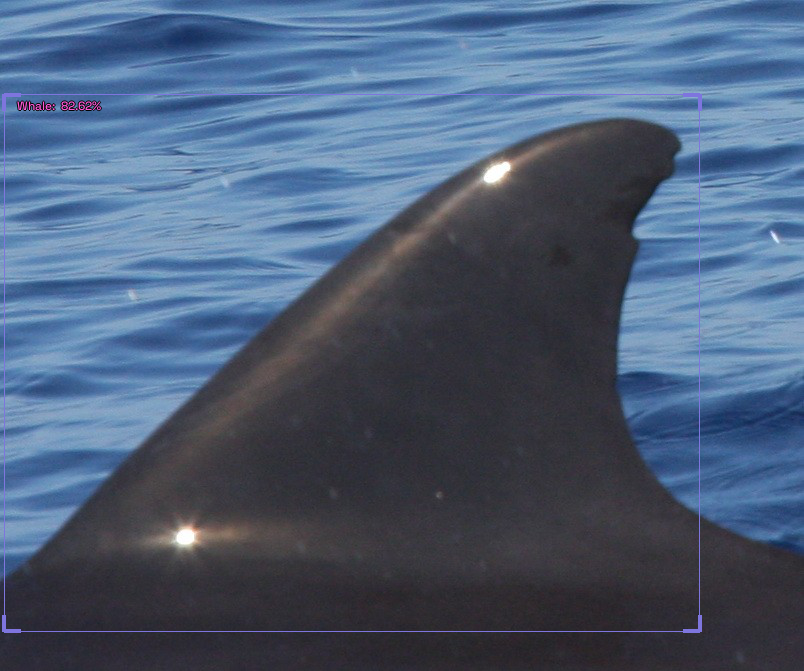

In [10]:
pred_dict["img"]

In [11]:
pred_dict["detection"]

{'bboxes': [<BBox (xmin:4, ymin:94, xmax:699, ymax:631)>],
 'scores': array([    0.82618], dtype=float32),
 'labels': ['whale'],
 'label_ids': [1]}

In [5]:
## inference
model = checkpoint_and_model["model"]
## Transforms

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])
## pick images from folder
path_to_folder = "/home/sample/"
img_files = get_image_files(path_to_folder)[:1000]
imgs_array = [Image.open(Path(o)) for o in img_files]
infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [6]:
## Batch inference
infer_dl = model_type.infer_dl(infer_ds, batch_size = 8, shuffle = False)
#preds= model_type.predict_from_dl(model, infer_dl, keep_images = True)

In [7]:
all_preds = {}
for img,name in zip(imgs_array, os.listdir("/home/sample/")):
    try :
        pred = model_type.end2end_detect(img, valid_tfms, model, class_map = class_map, detection_threshold = 0.1)
        all_preds[name] = pred['detection']
    except :
        print (f"Failed for file {name}")
        all_preds[name] = 0

Failed for file 028916b71276c1.jpg
Failed for file 04589b2274777f.jpg
Failed for file 04de59fa1e6b51.jpg
Failed for file 06c41c300fa025.jpg
Failed for file 093fdf1f473259.jpg
Failed for file 09441024a2cd03.jpg
Failed for file 0e3632d2b7a693.jpg
Failed for file 0e8bbbee865168.jpg
Failed for file 0f353b1113c19f.jpg
Failed for file 0f96d66b9e08cb.jpg
Failed for file 10c2a3c72ef0eb.jpg
Failed for file 1224c4d7163d9d.jpg
Failed for file 13fc5fbdbd06ec.jpg
Failed for file 147ef9e0bd2891.jpg
Failed for file 17137880ac6bcc.jpg
Failed for file 19f90bea0796ca.jpg
Failed for file 1aeb661f008cf8.jpg
Failed for file 1aff19aeca3de6.jpg
Failed for file 1cbdec475fead0.jpg
Failed for file 1dec26bb8da51a.jpg
Failed for file 2027162447eac7.jpg
Failed for file 203e0406f760e3.jpg
Failed for file 21d96cafd216d4.jpg
Failed for file 22de9b0a3c204d.jpg
Failed for file 2336a7b8debc9f.jpg
Failed for file 28c2a136a001bc.jpg
Failed for file 2b540bfafb7d13.jpg
Failed for file 2dc5ed978f385c.jpg
Failed for file 2e38

In [8]:
len(all_preds)

1000

In [11]:
list(all_preds.keys())[:5]

['001001f099519f.jpg',
 '001cfade605960.jpg',
 '002618d6f63ebc.jpg',
 '002ac5f9ad7c10.jpg',
 '002e00960cec44.jpg']

In [12]:
all_preds['001001f099519f.jpg']

{'labels': ['whale', 'whale'],
 'label_ids': [1, 1],
 'bboxes': [<BBox (xmin:618, ymin:1002, xmax:2043, ymax:1433)>,
  <BBox (xmin:852, ymin:946, xmax:2933, ymax:1396)>],
 'scores': array([     0.2456,     0.13757], dtype=float32)}

In [57]:
b = all_preds['001001f099519f.jpg']['bboxes'][0]

In [58]:
b

<BBox (xmin:618, ymin:1002, xmax:2043, ymax:1433)>

In [59]:
b = str(b)

In [60]:
b

'<BBox (xmin:618, ymin:1002, xmax:2043, ymax:1433)>'

In [61]:
import re
b = re.sub(r'[^0-9]', ' ', b)

In [62]:
b

'            618       1002       2043       1433  '

In [64]:
b = b.strip()

In [65]:
b

'618       1002       2043       1433'

In [68]:
b = " ".join(b.split())

In [71]:
b

'618 1002 2043 1433'

In [73]:
b = b.split(" ")

In [74]:
b

['618', '1002', '2043', '1433']

In [75]:
b = [float(o) for o in b]
b

[618.0, 1002.0, 2043.0, 1433.0]

In [78]:
len(all_preds['001001f099519f.jpg']['scores'])

2

In [79]:
all_preds['001001f099519f.jpg']['scores'][0]

0.24559896

In [83]:
if len(all_preds['001001f099519f.jpg']['scores']) > 1:
    a = all_preds['001001f099519f.jpg']['scores'][0]
    b = all_preds['001001f099519f.jpg']['scores'][1]
    if a > b :
        idx = 0
    else :
        idx = 1
    
    b = all_preds['001001f099519f.jpg']['bboxes'][idx]
    b = str(b)
    b = re.sub(r'[^0-9]', ' ', b)
    b = b.strip()
    b = " ".join(b.split())
    b = b.split(" ")
    b = [float(o) for o in b]

In [84]:
b

[618.0, 1002.0, 2043.0, 1433.0]

In [85]:
img = Image.open("/home/sample/001001f099519f.jpg").shape

In [86]:
img

(2399, 3599)

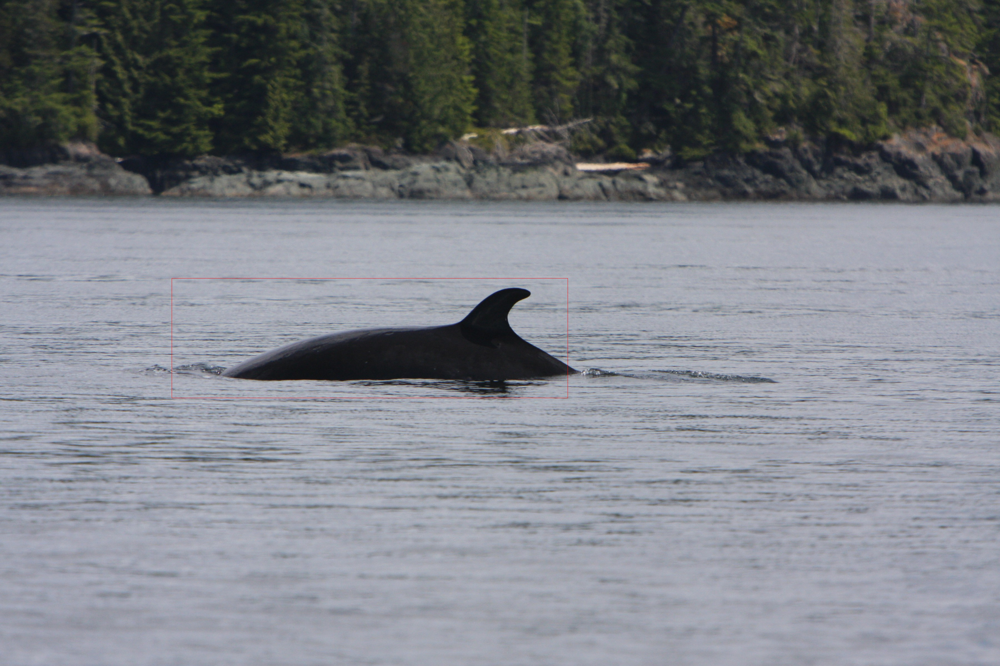

In [89]:
import math
from PIL import Image, ImageDraw
  
w, h = 2399, 3599
shape = b
  
# creating new Image object
img = Image.open("/home/sample/001001f099519f.jpg")
  
# create rectangle image
img1 = ImageDraw.Draw(img)  
img1.rectangle(shape, outline ="red")
img.show()

In [90]:
all_preds['028916b71276c1.jpg']

0

In [94]:
len(all_preds['001cfade605960.jpg']['scores'])

0

In [98]:
Path.cwd()

Path('/home/fluke')

In [104]:
with open("/home/bbox_dictionary/bbox_dict.pkl", "wb") as f :
    pickle.dump(all_preds, f)

In [108]:
len(all_preds['002618d6f63ebc.jpg']['scores'])

1

In [ ]:
all_preds